In [1]:
import warnings
warnings.filterwarnings('ignore') 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style

In [ ]:
Root_dir = "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "/kaggle/input/new-plant-diseases-dataset/test"
Diseases_classes = os.listdir(train_dir)

In [ ]:
print(*sorted(Diseases_classes),sep="\n")
print("\nTotal number of classes are: ", len(Diseases_classes))

In [2]:
import matplotlib.pyplot as plt
import os

# Assume you have two datasets
train_dir1 = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
train_dir2 = '/kaggle/input/extended-dataset/extended_new/train'

# Assume Diseases_classes is a list of all class names (from both datasets merged)
Diseases_classes = sorted(list(set(os.listdir(train_dir1)) | set(os.listdir(train_dir2))))

plt.figure(figsize=(60, 60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7, 7, cnt)

    num_images_in_class = 0
    img_show = None

    # Try to find and display image from first dataset
    if os.path.exists(os.path.join(train_dir1, i)):
        image_files = os.listdir(os.path.join(train_dir1, i))
        num_images_in_class += len(image_files)
        if len(image_files) > 0:
            img_show = plt.imread(os.path.join(train_dir1, i, image_files[0]))

    # Try to find and display image from second dataset (if first dataset has none)
    if img_show is None and os.path.exists(os.path.join(train_dir2, i)):
        image_files = os.listdir(os.path.join(train_dir2, i))
        num_images_in_class += len(image_files)
        if len(image_files) > 0:
            img_show = plt.imread(os.path.join(train_dir2, i, image_files[0]))

    print(f"The Number of Images in {i}: {num_images_in_class}", end="  ")
    tot_images += num_images_in_class

    # Only show if image is found
    if img_show is not None:
        plt.imshow(img_show)
        plt.xlabel(i, fontsize=30)
        plt.xticks([])
        plt.yticks([])
    else:
        print(f"(No images found for class {i})")

print("\nTotal Number of Images in Both Directories:", tot_images)
plt.tight_layout()
plt.show()


The Number of Images in Apple___Apple_scab: 2016  The Number of Images in Apple___Black_rot: 1987  The Number of Images in Apple___Cedar_apple_rust: 1760  The Number of Images in Apple___healthy: 2008  The Number of Images in Blueberry___healthy: 1816  The Number of Images in Cherry_(including_sour)___Powdery_mildew: 1683  The Number of Images in Cherry_(including_sour)___healthy: 1826  The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642  The Number of Images in Corn_(maize)___Common_rust_: 1907  The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 1908  The Number of Images in Corn_(maize)___healthy: 1859  The Number of Images in Grape___Black_rot: 1888  The Number of Images in Grape___Esca_(Black_Measles): 1920  The Number of Images in Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722  The Number of Images in Grape___healthy: 1692  The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010  The Number of Images in Peach___Bacterial_spot

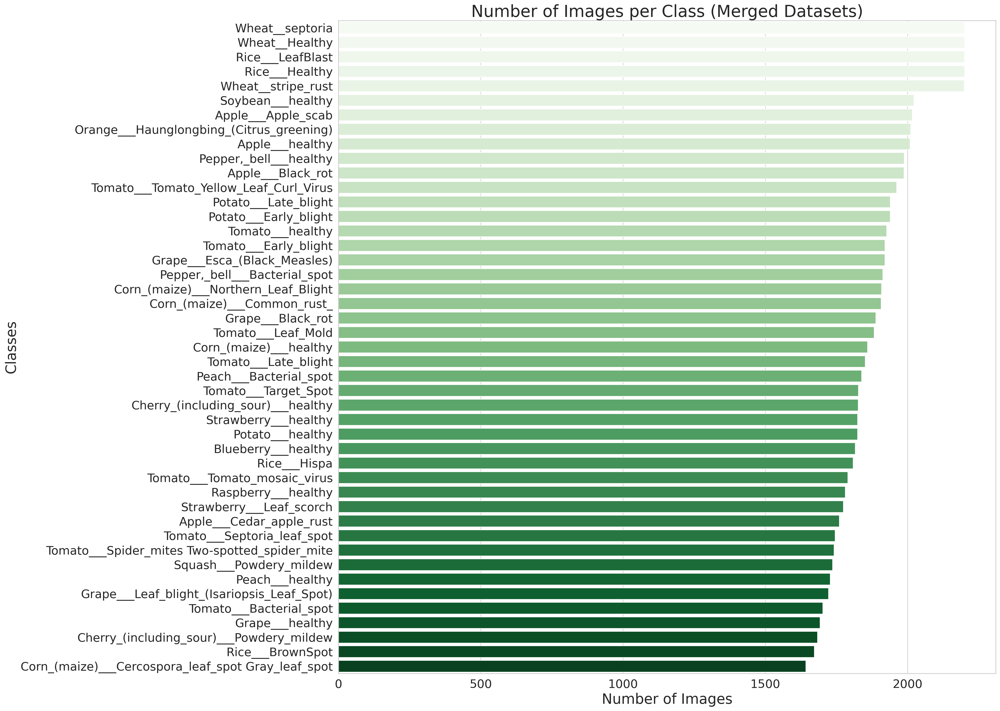

In [3]:
import os
import seaborn as sns
import matplotlib.pyplot as plt


# Merge class names
Diseases_classes = sorted(list(set(os.listdir(train_dir1)) | set(os.listdir(train_dir2))))

# Lists to store results
plant_names = []
Len = []

for i in Diseases_classes:
    plant_names.append(i)

    # Count images from dataset 1
    count1 = 0
    if os.path.exists(os.path.join(train_dir1, i)):
        count1 = len(os.listdir(os.path.join(train_dir1, i)))

    # Count images from dataset 2
    count2 = 0
    if os.path.exists(os.path.join(train_dir2, i)):
        count2 = len(os.listdir(os.path.join(train_dir2, i)))

    # Total images
    Len.append(count1 + count2)

# Now, sort Len and plant_names together (descending by Len)
sorted_pairs = sorted(zip(Len, plant_names), reverse=True)
Len_sorted, plant_names_sorted = zip(*sorted_pairs)

# ADD this:
Len_sorted = list(Len_sorted)
plant_names_sorted = list(plant_names_sorted)


# Plot
sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20, 20), dpi=200)
ax = sns.barplot(x=Len_sorted, y=plant_names_sorted, palette="Greens")

plt.xlabel('Number of Images', fontsize=24)
plt.ylabel('Classes', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Number of Images per Class (Merged Datasets)', fontsize=28)
plt.show()


In [4]:
import os
from torchvision import datasets
from torchvision.datasets.folder import default_loader
from torch.utils.data import ConcatDataset, Dataset
from collections import OrderedDict

transformation = transforms.Compose([
    transforms.Resize((256, 256)),       # Resize images to 256x256
    transforms.ToTensor(),                # Convert to tensor
])

# Custom Dataset to remap class indices
class RemappedImageFolder(Dataset):
    def __init__(self, dataset, new_class_to_idx):
        self.dataset = dataset
        self.new_class_to_idx = new_class_to_idx
        self.loader = default_loader
        self.samples = []

        # Remap samples to new class index
        for path, old_target in self.dataset.samples:
            class_name = self.dataset.classes[old_target]
            new_target = self.new_class_to_idx[class_name]
            self.samples.append((path, new_target))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        image = self.loader(path)
        if self.dataset.transform is not None:
            image = self.dataset.transform(image)
        return image, target


# Load both datasets
train1 = datasets.ImageFolder(train_dir1,transform=transformation)
train2 = datasets.ImageFolder(train_dir2,transform=transformation)

# Create a unified class list
all_classes = sorted(set(train1.classes) | set(train2.classes))
unified_class_to_idx = {cls_name: idx for idx, cls_name in enumerate(all_classes)}

# Remap both datasets
remapped1 = RemappedImageFolder(train1, unified_class_to_idx)
remapped2 = RemappedImageFolder(train2, unified_class_to_idx)

# Merge
train_merged = ConcatDataset([remapped1, remapped2])
train_merged.classes = list(unified_class_to_idx.keys())
train_merged.class_to_idx = unified_class_to_idx

In [5]:
val1 = datasets.ImageFolder('/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',transform=transformation)
val2 = datasets.ImageFolder('/kaggle/input/extended-dataset/extended_new/val',transform=transformation)

# Create a unified class list
all_classes = sorted(set(val1.classes) | set(val2.classes))
unified_class_to_idx = {cls_name: idx for idx, cls_name in enumerate(all_classes)}

# Remap both datasets
remapped1 = RemappedImageFolder(val1, unified_class_to_idx)
remapped2 = RemappedImageFolder(val2, unified_class_to_idx)

# Merge
val_merged = ConcatDataset([remapped1, remapped2])
val_merged.classes = list(unified_class_to_idx.keys())
val_merged.class_to_idx = unified_class_to_idx

In [ ]:
transformation = transforms.Compose([
    transforms.Resize((256, 256)),       # Resize images to 256x256
    transforms.ToTensor(),                # Convert to tensor
])
train = ImageFolder(train_dir, transform=transformation)
valid = ImageFolder(valid_dir, transform=transformation) 

In [6]:
len(train_merged.classes)

45

In [7]:
train_merged.classes

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Rice___BrownSpot',
 'Rice___Healthy',
 'Rice___Hispa',
 'Rice___LeafBlast',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Le

In [8]:
train_merged[0]

(tensor([[[0.6549, 0.6510, 0.6471,  ..., 0.7255, 0.7176, 0.7098],
          [0.6667, 0.6627, 0.6588,  ..., 0.7294, 0.7216, 0.7176],
          [0.6667, 0.6627, 0.6588,  ..., 0.7373, 0.7294, 0.7255],
          ...,
          [0.3922, 0.4000, 0.4078,  ..., 0.4941, 0.4941, 0.4941],
          [0.3961, 0.4000, 0.4039,  ..., 0.4784, 0.4824, 0.4824],
          [0.4078, 0.4039, 0.4000,  ..., 0.4745, 0.4784, 0.4824]],
 
         [[0.6392, 0.6353, 0.6314,  ..., 0.7137, 0.7059, 0.6980],
          [0.6510, 0.6471, 0.6431,  ..., 0.7176, 0.7098, 0.7059],
          [0.6510, 0.6471, 0.6431,  ..., 0.7255, 0.7176, 0.7137],
          ...,
          [0.3529, 0.3608, 0.3686,  ..., 0.4314, 0.4314, 0.4314],
          [0.3569, 0.3608, 0.3647,  ..., 0.4157, 0.4196, 0.4196],
          [0.3686, 0.3647, 0.3608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.7686, 0.7647, 0.7608,  ..., 0.8275, 0.8196, 0.8118],
          [0.7804, 0.7765, 0.7725,  ..., 0.8314, 0.8235, 0.8196],
          [0.7804, 0.7765, 0.7725,  ...,

In [9]:
train_merged[7000]

(tensor([[[0.7137, 0.6824, 0.6549,  ..., 0.7020, 0.7137, 0.7373],
          [0.6863, 0.5608, 0.5294,  ..., 0.6784, 0.6902, 0.7098],
          [0.4235, 0.4471, 0.6902,  ..., 0.6941, 0.6980, 0.7176],
          ...,
          [0.2667, 0.3137, 0.3137,  ..., 0.2902, 0.3137, 0.3373],
          [0.2314, 0.2667, 0.2353,  ..., 0.3216, 0.3216, 0.3216],
          [0.1765, 0.2314, 0.2275,  ..., 0.3451, 0.3294, 0.3098]],
 
         [[0.6706, 0.6392, 0.6118,  ..., 0.6745, 0.6863, 0.7098],
          [0.6431, 0.5176, 0.4863,  ..., 0.6510, 0.6627, 0.6824],
          [0.3765, 0.4039, 0.6471,  ..., 0.6667, 0.6706, 0.6902],
          ...,
          [0.2588, 0.3059, 0.3059,  ..., 0.3294, 0.3490, 0.3725],
          [0.2235, 0.2588, 0.2275,  ..., 0.3608, 0.3569, 0.3569],
          [0.1686, 0.2235, 0.2196,  ..., 0.3843, 0.3647, 0.3451]],
 
         [[0.7020, 0.6706, 0.6353,  ..., 0.7451, 0.7569, 0.7804],
          [0.6745, 0.5490, 0.5176,  ..., 0.7216, 0.7333, 0.7529],
          [0.4157, 0.4353, 0.6784,  ...,

In [10]:
train_merged[70000]

(tensor([[[0.6471, 0.5020, 0.5529,  ..., 0.5882, 0.5059, 0.5922],
          [0.6667, 0.6706, 0.6471,  ..., 0.5412, 0.6118, 0.5490],
          [0.5294, 0.5098, 0.6196,  ..., 0.6157, 0.5804, 0.7216],
          ...,
          [0.3176, 0.2980, 0.3333,  ..., 0.3490, 0.4196, 0.5020],
          [0.3176, 0.3608, 0.4314,  ..., 0.4431, 0.4275, 0.4039],
          [0.3843, 0.3176, 0.3529,  ..., 0.4549, 0.4118, 0.3686]],
 
         [[0.6235, 0.4784, 0.5294,  ..., 0.5686, 0.4863, 0.5725],
          [0.6431, 0.6471, 0.6235,  ..., 0.5216, 0.5922, 0.5294],
          [0.5059, 0.4863, 0.5961,  ..., 0.5961, 0.5608, 0.7020],
          ...,
          [0.3137, 0.2941, 0.3294,  ..., 0.3529, 0.4235, 0.5059],
          [0.3137, 0.3569, 0.4275,  ..., 0.4471, 0.4314, 0.4078],
          [0.3804, 0.3137, 0.3490,  ..., 0.4588, 0.4157, 0.3725]],
 
         [[0.6392, 0.4941, 0.5451,  ..., 0.5922, 0.5098, 0.5961],
          [0.6588, 0.6627, 0.6392,  ..., 0.5451, 0.6157, 0.5529],
          [0.5216, 0.5020, 0.6118,  ...,

In [11]:
img, label = train_merged[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


Label :Apple___Apple_scab(0)
Label :Apple___Black_rot(1)
Label :Apple___Cedar_apple_rust(2)
Label :Blueberry___healthy(4)
Label :Cherry_(including_sour)___healthy(6)
Label :Corn_(maize)___Common_rust_(8)
Label :Tomato___Septoria_leaf_spot(36)
Label :Tomato___healthy(41)


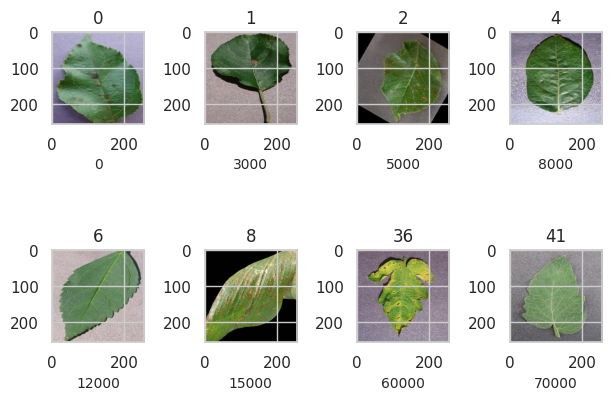

In [12]:
def show_image(image, label):
    print("Label :" + train_merged.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    
    
image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]
    
chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train_merged[img][1])
    show_image(*train_merged[img])

In [13]:
batch_size = 32

In [14]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train_merged, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(val_merged, batch_size, num_workers=2, pin_memory=True)

In [15]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [16]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [17]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [18]:
device = get_default_device()
device

device(type='cuda')

In [19]:
# Moving data into GPU, WrappedDataLoader
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

In [20]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [21]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [22]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

In [23]:
# resnet architecture 
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) 
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)
        
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out        

In [24]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train_merged.classes)), device) 
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

In [25]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [26]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [27]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy. 
    #The 1cycle policy anneals the learning rate from an initial learning rate to some 
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate. 
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation
        
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history
    

In [28]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 49 s, sys: 8.23 s, total: 57.2 s
Wall time: 3min 4s


[{'val_loss': 3.8075215816497803, 'val_acc': 0.019021738320589066}]

In [29]:
num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [30]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader, 
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=optims)

Epoch [0], train_loss: 0.7998, val_loss: 1.9297, val_acc: 0.5869
Epoch [1], train_loss: 0.4633, val_loss: 0.7814, val_acc: 0.7426
Epoch [2], train_loss: 0.3458, val_loss: 0.4588, val_acc: 0.8290
Epoch [3], train_loss: 0.1979, val_loss: 0.3021, val_acc: 0.8889
Epoch [4], train_loss: 0.0999, val_loss: 0.2604, val_acc: 0.9035
CPU times: user 13min 16s, sys: 9min 1s, total: 22min 17s
Wall time: 1h 2min 15s


In [31]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

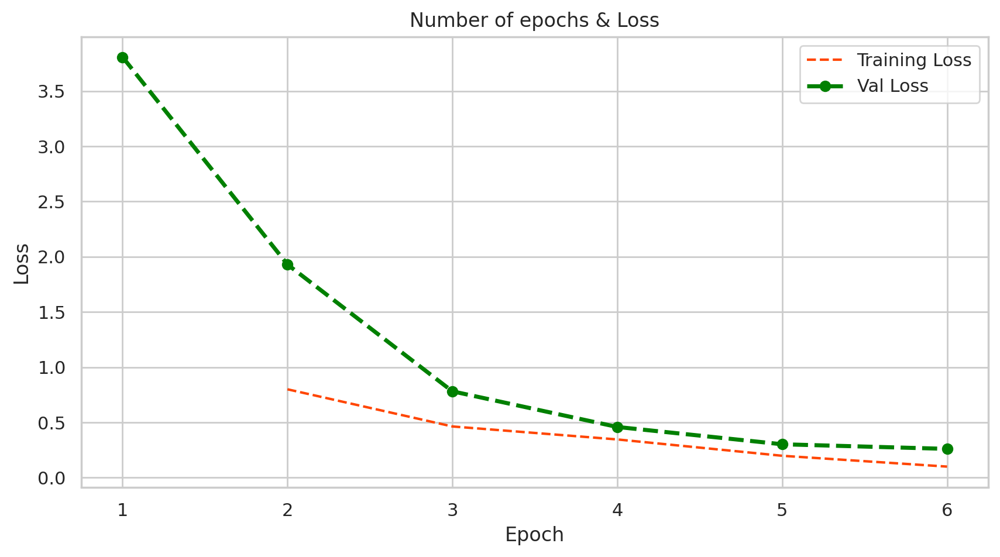

In [32]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

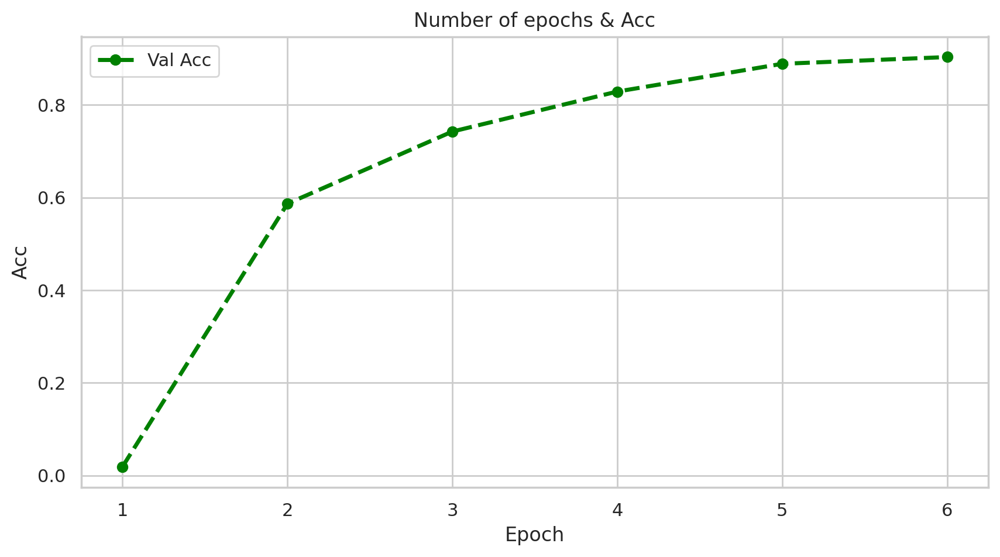

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show()

In [36]:
test_dir="/kaggle/input/new-plant-diseases-dataset/test"
test = ImageFolder(test_dir, transform=transforms.ToTensor())
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))


['AppleCedarRust1.JPG', 'AppleCedarRust2.JPG', 'AppleCedarRust3.JPG', 'AppleCedarRust4.JPG', 'AppleScab1.JPG', 'AppleScab2.JPG', 'AppleScab3.JPG', 'CornCommonRust1.JPG', 'CornCommonRust2.JPG', 'CornCommonRust3.JPG', 'PotatoEarlyBlight1.JPG', 'PotatoEarlyBlight2.JPG', 'PotatoEarlyBlight3.JPG', 'PotatoEarlyBlight4.JPG', 'PotatoEarlyBlight5.JPG', 'PotatoHealthy1.JPG', 'PotatoHealthy2.JPG', 'TomatoEarlyBlight1.JPG', 'TomatoEarlyBlight2.JPG', 'TomatoEarlyBlight3.JPG', 'TomatoEarlyBlight4.JPG', 'TomatoEarlyBlight5.JPG', 'TomatoEarlyBlight6.JPG', 'TomatoHealthy1.JPG', 'TomatoHealthy2.JPG', 'TomatoHealthy3.JPG', 'TomatoHealthy4.JPG', 'TomatoYellowCurlVirus1.JPG', 'TomatoYellowCurlVirus2.JPG', 'TomatoYellowCurlVirus3.JPG', 'TomatoYellowCurlVirus4.JPG', 'TomatoYellowCurlVirus5.JPG', 'TomatoYellowCurlVirus6.JPG']
33


In [42]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train_merged.classes[preds[0].item()]


Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust


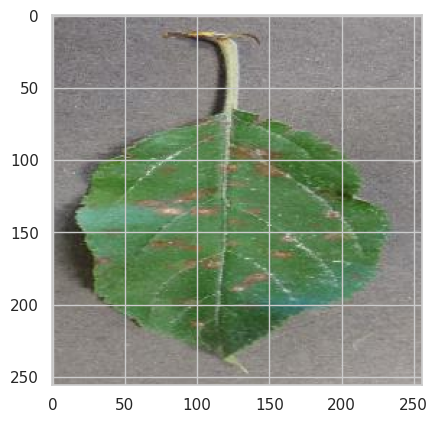

In [43]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))


Label: AppleScab2.JPG , Predicted: Apple___Apple_scab


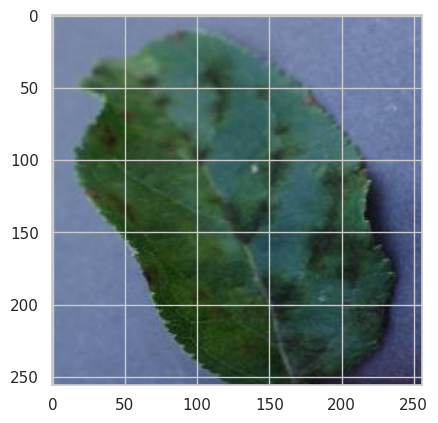

In [44]:
# predicting first image
img, label = test[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))


Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_


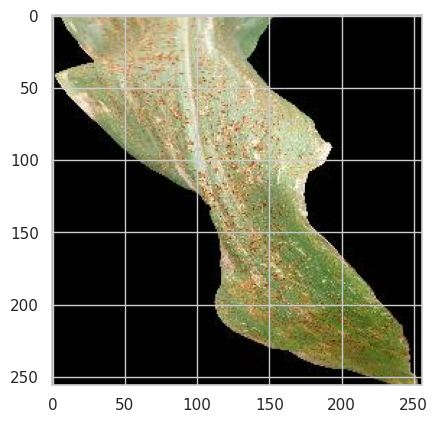

In [45]:
# predicting first image
img, label = test[9]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))


Label: PotatoHealthy2.JPG , Predicted: Potato___healthy


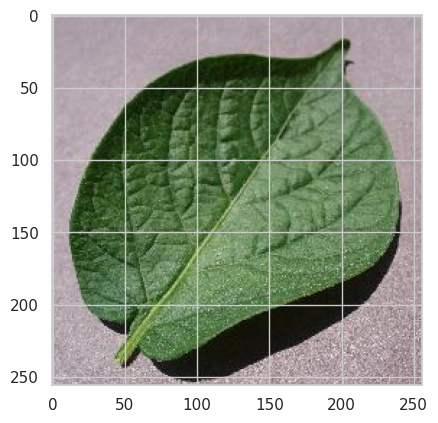

In [46]:
# predicting first image
img, label = test[16]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))


Label: TomatoHealthy4.JPG , Predicted: Tomato___healthy


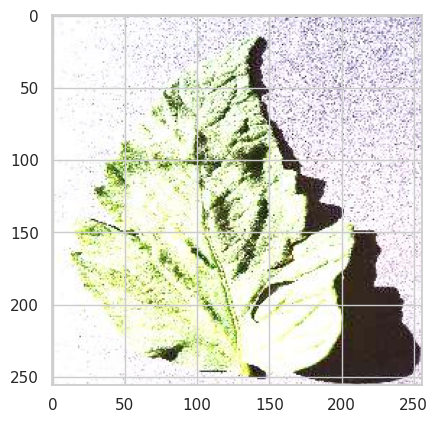

In [47]:
# predicting first image
img, label = test[26]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[26], ', Predicted:', predict_image(img, model))

In [48]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print(Fore.GREEN)
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))


Label: AppleCedarRust1.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust3.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust4.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleScab1.JPG , Predicted: Apple___Apple_scab

Label: AppleScab2.JPG , Predicted: Apple___Apple_scab

Label: AppleScab3.JPG , Predicted: Apple___Apple_scab

Label: CornCommonRust1.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust2.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_

Label: PotatoEarlyBlight1.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight2.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight3.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight4.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight5.JPG , Predicted: Potato___Early_blight

Label: PotatoHealthy1.JPG , Predi

In [ ]:
torch.save(model.state_dict(), '/kaggle/working/my_with.pth')